# Exploratory analysis (v0.11)

This notebook presents an exploratory analysis of the embeddings generated for the city of Leicester by our model v0.5 trained on a randomly sampled 1% of the nodes from 138 cities in the UK. See [`gnnuf_train.py`](https://github.com/sdesabbata/gnn-urban-form/blob/main/code/gnnuf_train.py) for further detail on the model training.

Table of contents:

- [Setup](#setup)
- [Load data](#load-data)
    - [Leicester OSMnx graph data](#leicester-osmnx-data)
    - [Leicester embeddings](#leicester-embeddings)
- [Preliminary embeddings plots](#preliminary-plots)
- [Correlations with node and ego-graph stats](#correlations)
- [Node spot checks](#spot-checks)
- [Exploring embedding patterns](#exploring-patters)
    - [Bivariate quantiles](#bivariate)
        - [Interactive bivariate map](#bivariate-map)
    - [Clusters](#clusters)
        - [Interactive clusters map](#clusters-map)
    - [Pooled embeddings bivariate quantiles](#bivariate-pooled)
- [Classic measures](#classic)
    - [City-wide centrality](#classic-centrality-networkwide)
    - [Ego-graph centrality](#classic-centrality-egograph)
    - [Street length and count](#classic-landc)


## Setup <a class="anchor" id="setup"></a>

In [2]:
# Base libraries
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
# NetworkX
import networkx as nx
import osmnx as ox
# OS environment setup
from local_directories import *

In [3]:
# Reset random seeds
random_seed = 2674
# Other
neighbourhood_min_nodes = 8
max_distance = 500

## Load data <a class="anchor" id="load-data"></a>

### Leicester OSMnx graph data <a class="anchor" id="leicester-osmnx-data"></a>

We used [the data made available by Boeing](https://dataverse.harvard.edu/dataverse/global-urban-street-networks/), which include simplified street networks of 138 cities in the UK derived from [OpenStreetMap](https://www.openstreetmap.org/#map=12/52.6334/-1.1076).

In [5]:
# Load Leciester's graph
leicester_osmnx_graph = ox.io.load_graphml(bulk_storage_directory + "/osmnx/raw/leicester-1864.graphml")
leicester_osmnx_graph_prj = ox.project_graph(leicester_osmnx_graph)

In [6]:
len(list(leicester_osmnx_graph.nodes))

13293

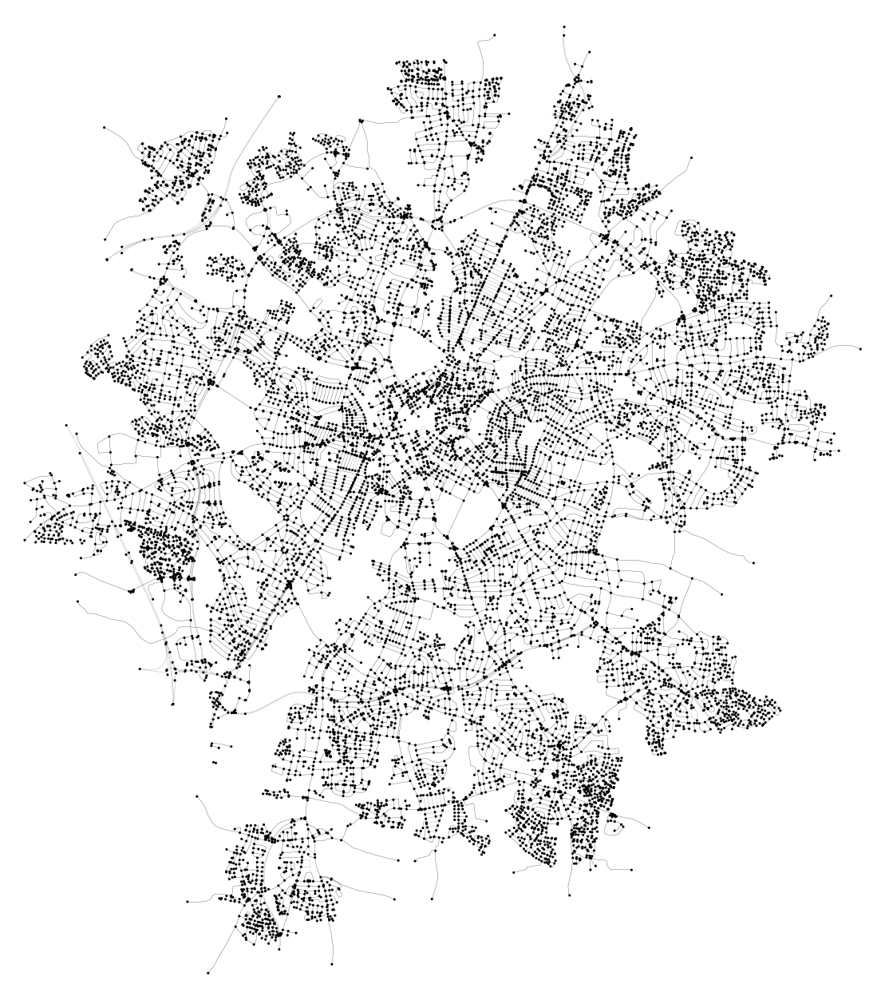

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [7]:
ox.plot_graph(
    leicester_osmnx_graph_prj,
    node_size=5, node_color="#000000",
    edge_color="#000000", edge_linewidth=0.1,
    bgcolor="#ffffff",
    figsize=(16, 16))

The code below extracts the tabular data from the OSMnx format into a dataframe.

In [8]:
# Convert graph to dataframe version
leicester_osmnx_graph_prj_df = None
for node in leicester_osmnx_graph_prj:
    node_dict = leicester_osmnx_graph_prj.nodes[node]
    node_dict["osmnx_node_id"] = int(node)
    # node_dict["osmnx_node_id"] = str(node)
    if leicester_osmnx_graph_prj_df is None:
        leicester_osmnx_graph_prj_df = pd.DataFrame.from_dict([node_dict])
    else:
        leicester_osmnx_graph_prj_df = pd.concat([leicester_osmnx_graph_prj_df, pd.DataFrame.from_dict([node_dict])])
leicester_osmnx_graph_prj_df.head()

,y,x,street_count,elevation,elevation_aster,elevation_srtm,lon,lat,osmnx_node_id,ref,highway
0,5.829804e+06,622151.977595,3,72.0,35,72,-1.196195,52.604506,194739,NaN,NaN
0,5.829991e+06,622098.041002,3,72.0,45,72,-1.196922,52.606196,1551014281,NaN,NaN
0,5.828827e+06,622259.813792,2,79.0,57,79,-1.194965,52.595696,326312,21,motorway_junction
0,5.830107e+06,622077.742140,3,79.0,43,79,-1.197179,52.607245,326320,21,motorway_junction
0,5.829673e+06,622220.645785,3,74.0,35,74,-1.195230,52.603314,2627867454,NaN,NaN


### Leicester embeddings <a class="anchor" id="leicester-embeddings"></a>

Load the pre-computed embeddings for Leicecster. See [`gnnuf_embedding_Leicester.py`](https://github.com/sdesabbata/gnn-urban-form/blob/main/code/gnnuf_embedding_Leicester.py) for further details.

In [10]:
# Load Leciester's embeddings
leicester_emb_df = pd.read_csv(this_repo_directory + "/data/leicester-1864_emb_gnnuf_model_v0-11-1.csv")
leicester_emb_df.head()

,osmnx_node_id,EMB000,EMB001,EMB002,EMB003,EMB004,EMB005,EMB006,EMB007
0,337976,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
1,337979,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
2,337983,0.0,0.0,1.327637,0.0,0.0,0.0,0.0,0.0
3,337985,0.0,0.0,1.370959,0.0,0.0,0.0,0.0,0.0
4,337986,0.0,0.0,0.997788,0.0,0.0,0.0,0.0,0.0


## Preliminary embeddings plots <a class="anchor" id="preliminary-plots"></a>

Let's start with a simple scatterplot showing the embeddings obtained for street junctions in Leicester, encoding the first embedding on the x-axis and the second embedding on the y-axis.

In [38]:
fig = px.scatter(
    leicester_emb_df,
    x="EMB000",
    y="EMB007",
    hover_data=['osmnx_node_id'],
    width=800, height=800
)
fig.update_layout({"plot_bgcolor": "#ffffff"})
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.show()

We can then add the embeddings as attributes to each node of the OSMnx graph and plot the values as street maps.

In [26]:
for node in leicester_osmnx_graph_prj.nodes:
    if len(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB000"].values) == 0:
        leicester_osmnx_graph_prj.nodes[node]["EMB000"] = None
        leicester_osmnx_graph_prj.nodes[node]["EMB001"] = None
        leicester_osmnx_graph_prj.nodes[node]["EMB002"] = None
        leicester_osmnx_graph_prj.nodes[node]["EMB003"] = None
        leicester_osmnx_graph_prj.nodes[node]["EMB004"] = None
        leicester_osmnx_graph_prj.nodes[node]["EMB005"] = None
        leicester_osmnx_graph_prj.nodes[node]["EMB006"] = None
        leicester_osmnx_graph_prj.nodes[node]["EMB007"] = None
    else:
        leicester_osmnx_graph_prj.nodes[node]["EMB000"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB000"].values)
        leicester_osmnx_graph_prj.nodes[node]["EMB001"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB001"].values)
        leicester_osmnx_graph_prj.nodes[node]["EMB002"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB002"].values)
        leicester_osmnx_graph_prj.nodes[node]["EMB003"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB003"].values)
        leicester_osmnx_graph_prj.nodes[node]["EMB004"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB004"].values)
        leicester_osmnx_graph_prj.nodes[node]["EMB005"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB005"].values)
        leicester_osmnx_graph_prj.nodes[node]["EMB006"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB006"].values)
        leicester_osmnx_graph_prj.nodes[node]["EMB007"] = float(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB007"].values)

/tmp/user/1001/ipykernel_54022/3483718161.py:12: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/tmp/user/1001/ipykernel_54022/3483718161.py:13: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/tmp/user/1001/ipykernel_54022/3483718161.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/tmp/user/1001/ipykernel_54022/3483718161.py:15: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a sin

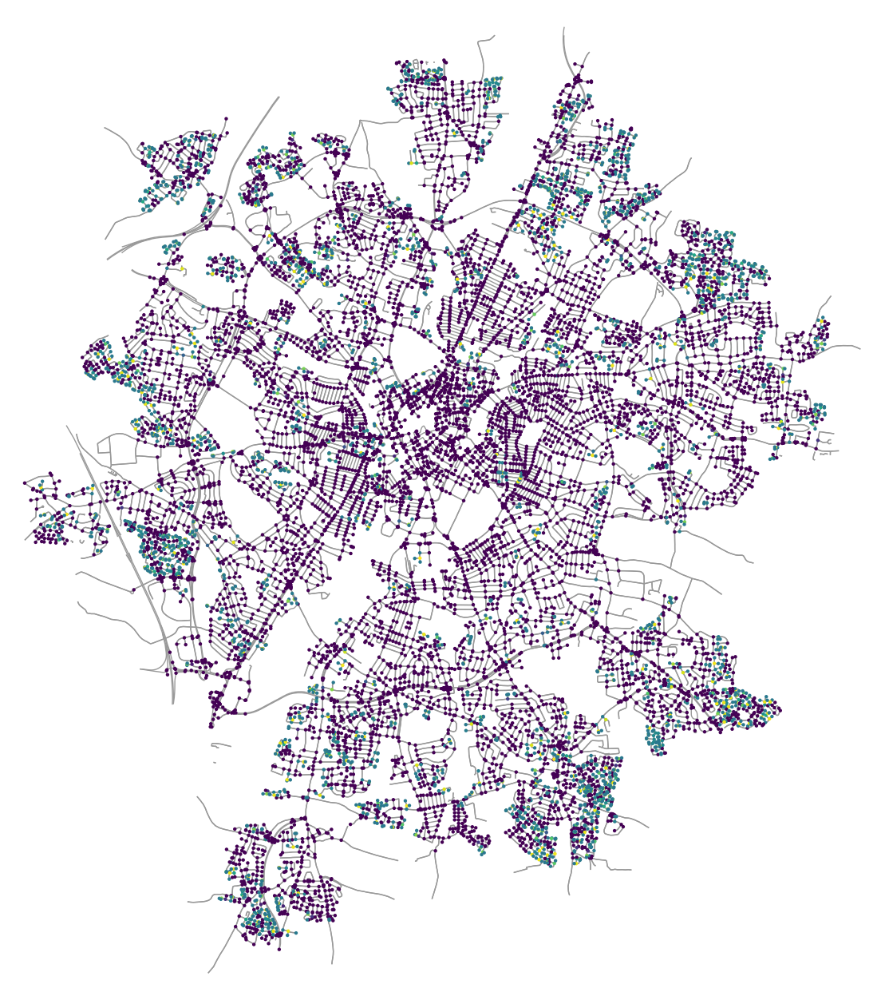

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [13]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB000"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

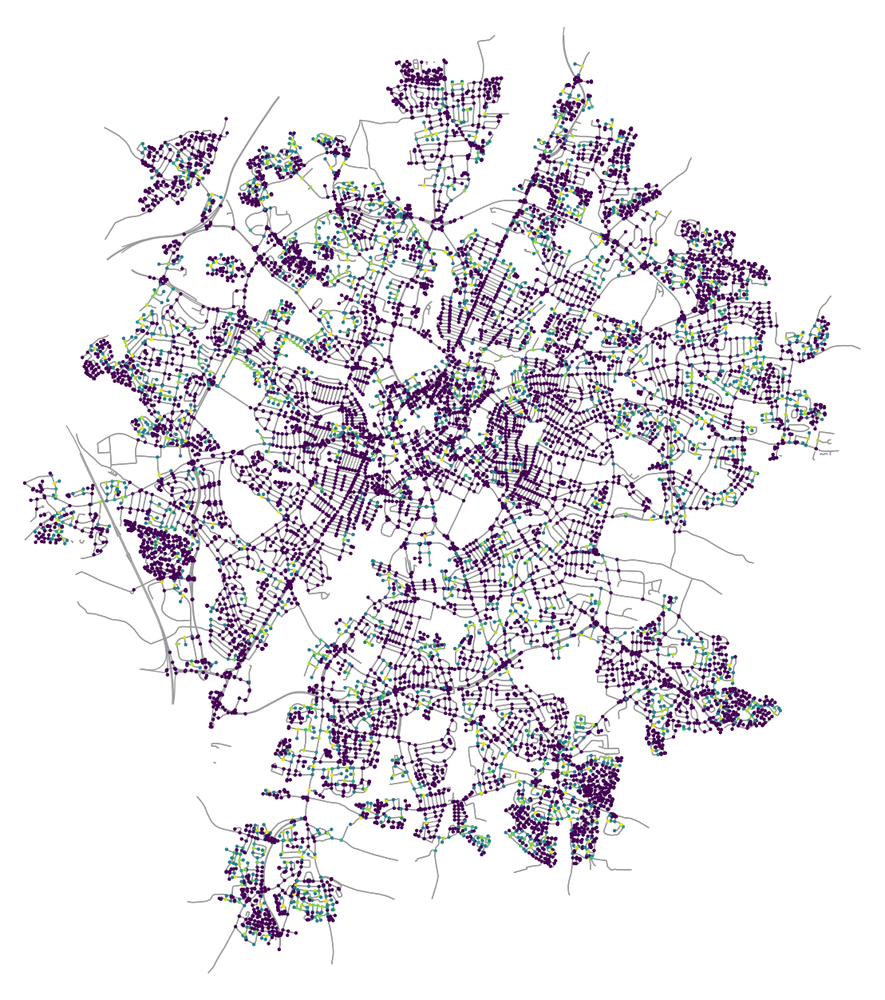

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [14]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB001"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

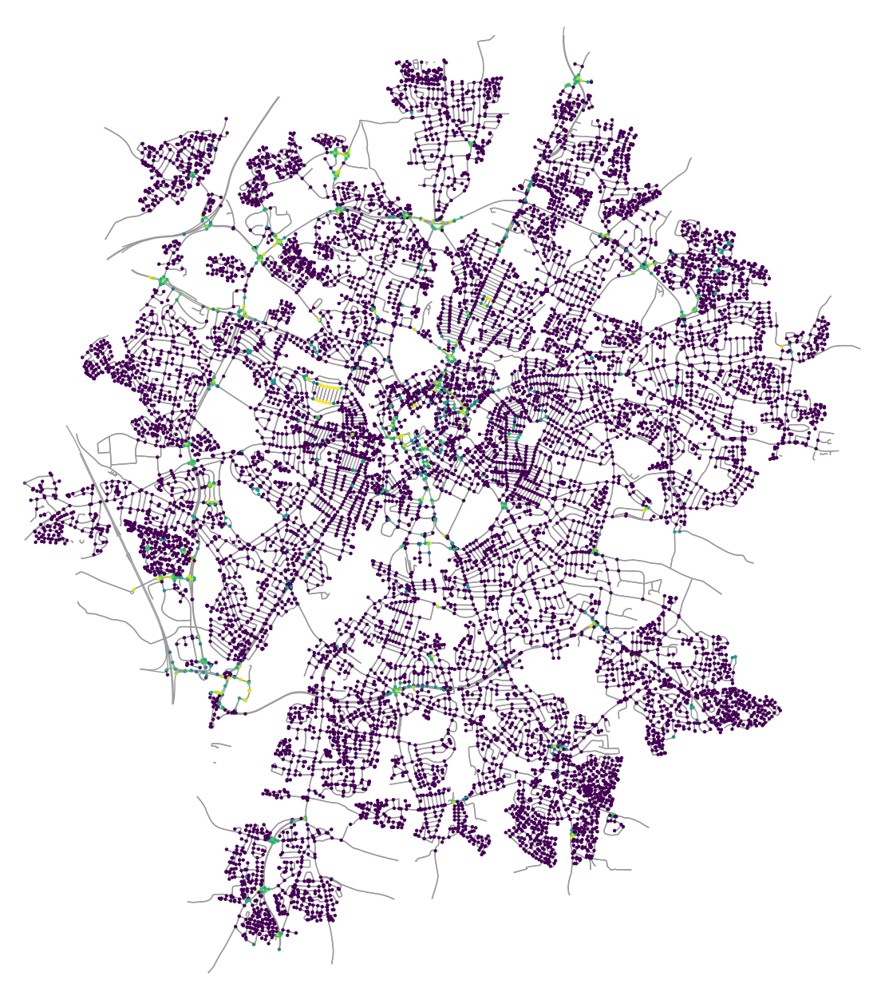

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [27]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB002"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

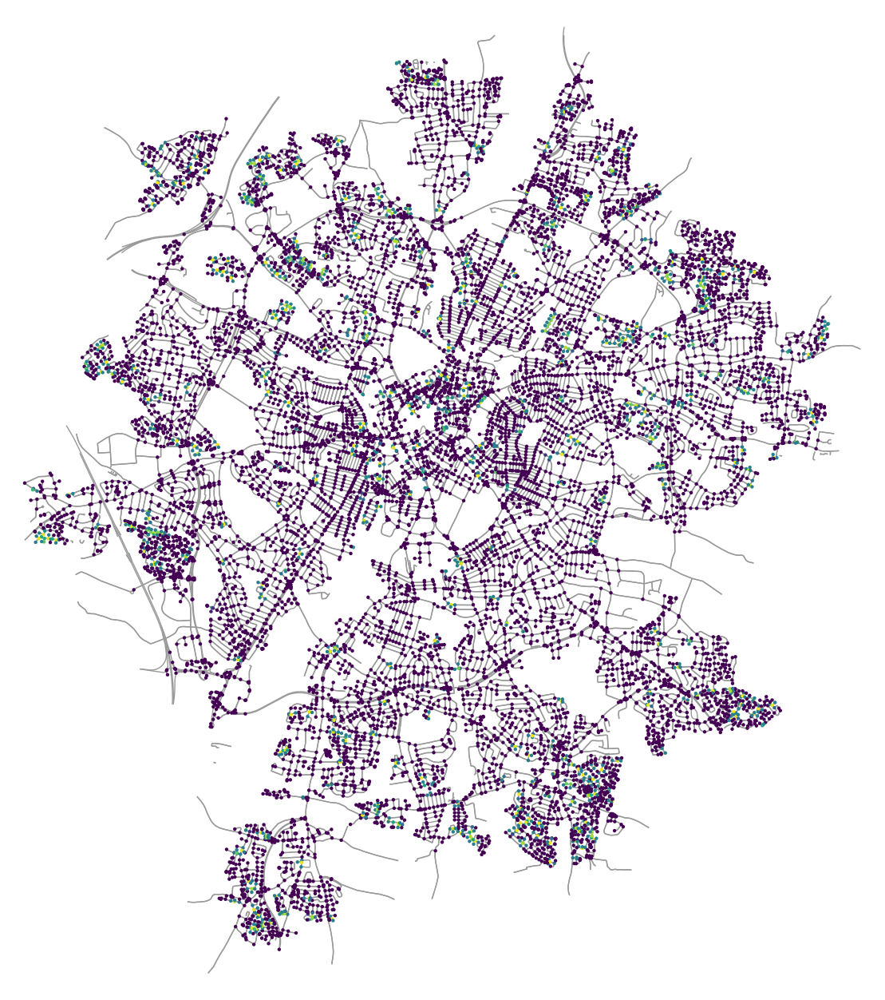

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [28]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB003"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

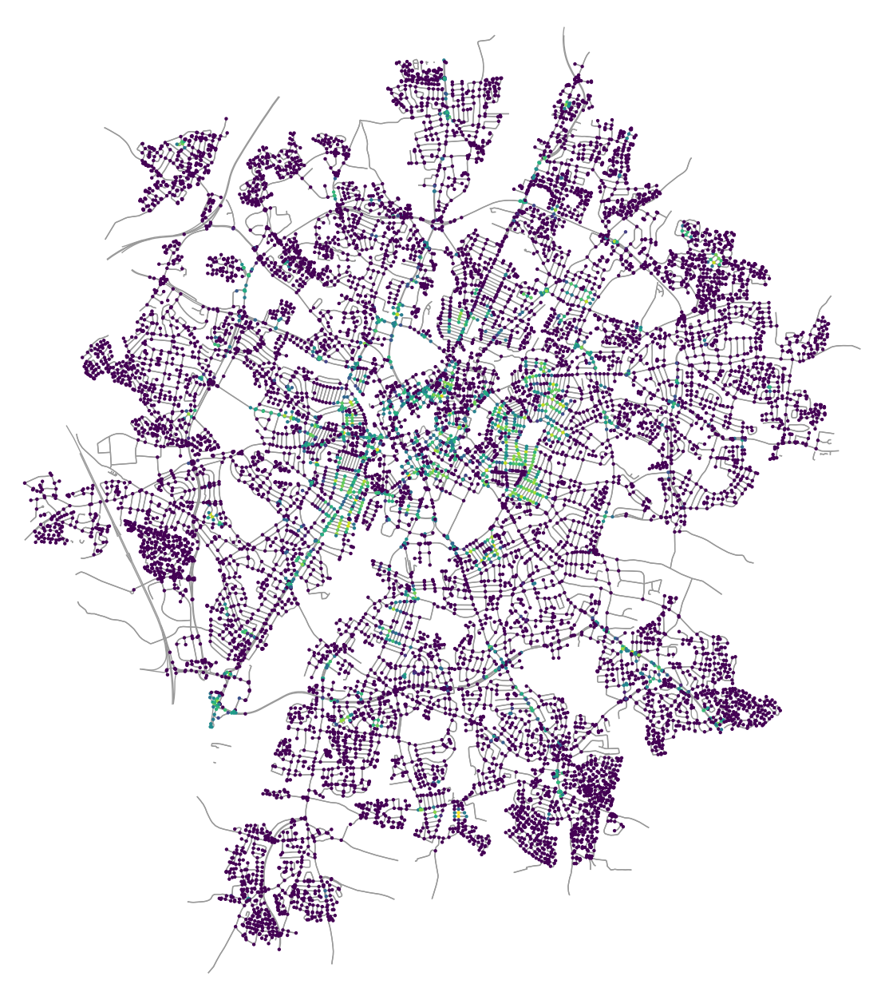

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [29]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB004"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

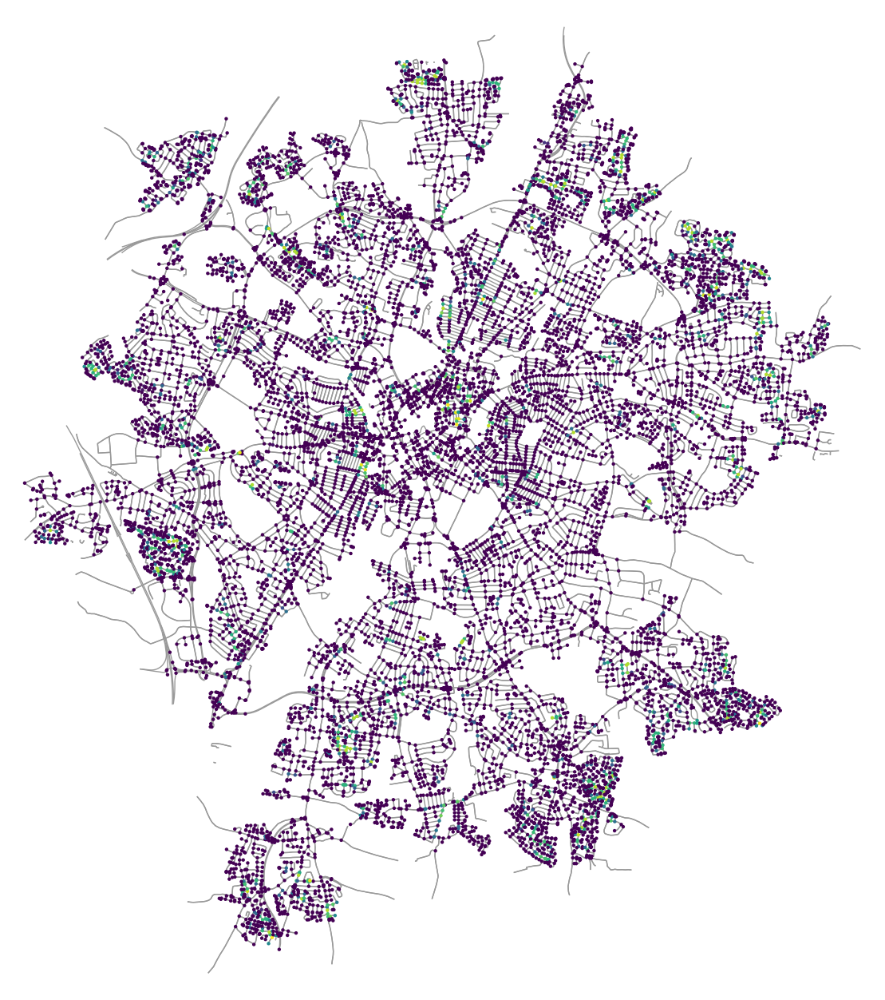

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [30]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB005"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

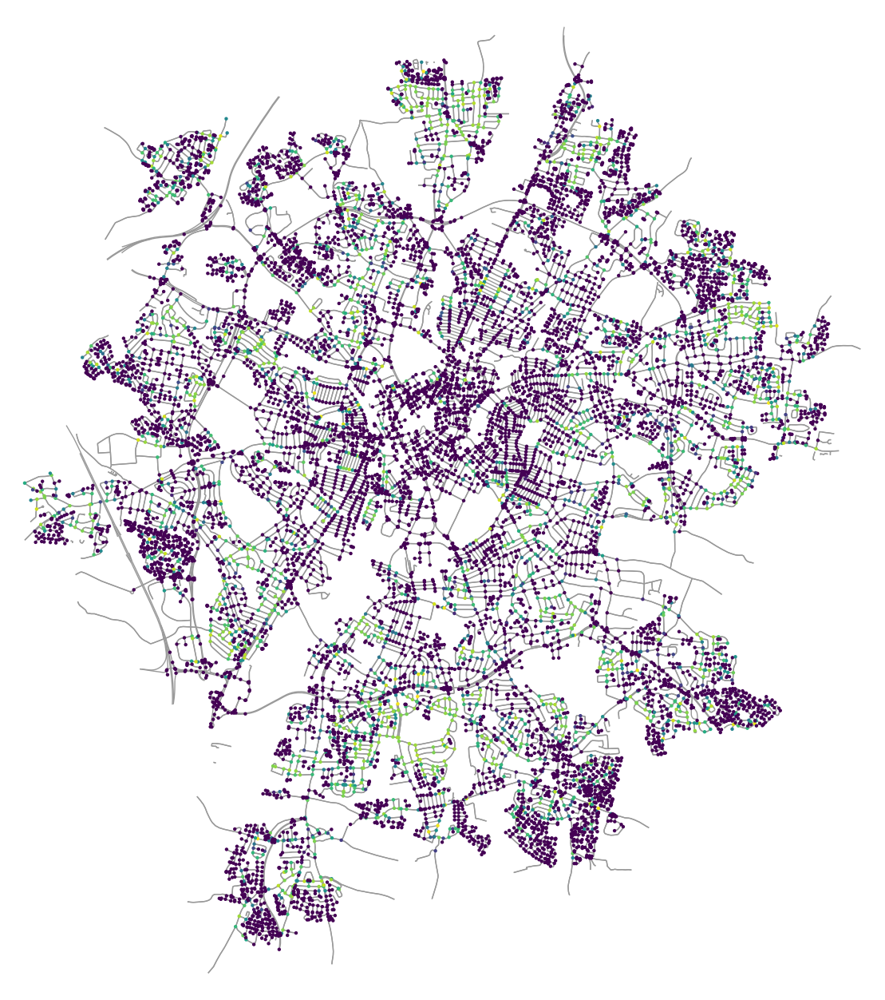

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [31]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB006"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

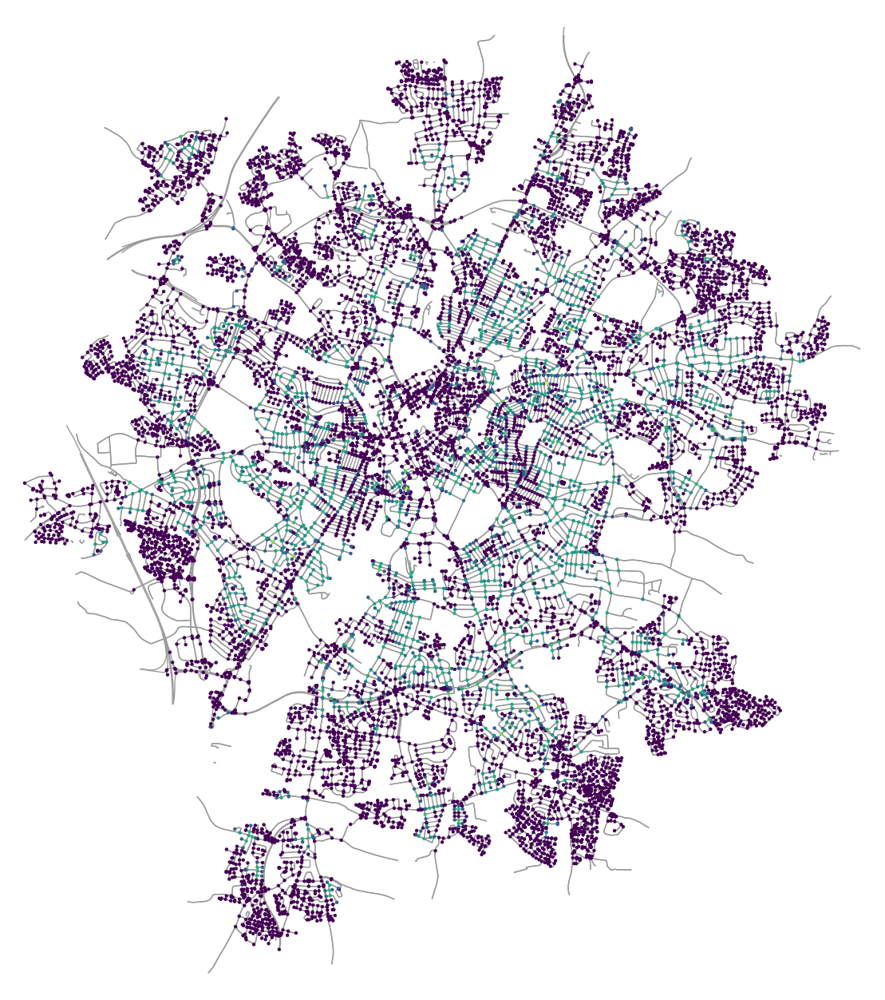

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [32]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["EMB007"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

In [23]:
emb_columns = ['EMB000', 'EMB001', 'EMB002', 'EMB003', 'EMB004', 'EMB005', 'EMB006', 'EMB007']
emb_colours = ["#e41a1c", "#377eb8", "#4daf4a", "#984ea3", "#ff7f00", "#ffff33", "#a65628", "#f781bf"]

for node in leicester_osmnx_graph_prj.nodes:
    if len(leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]["EMB000"].values) == 0:
        leicester_osmnx_graph_prj.nodes[node]["top_emb"] = "#cccccc"
    else:
        node_df = leicester_emb_df[leicester_emb_df["osmnx_node_id"] == node]
        top_emb_val = node_df[emb_columns].max(axis=1).values[0]
        if top_emb_val == 0:
            leicester_osmnx_graph_prj.nodes[node]["top_emb"] = "#000000"
        else:
            top_emb_idx = node_df[emb_columns].idxmax(axis=1).values[0]
            leicester_osmnx_graph_prj.nodes[node]["top_emb"] = emb_colours[emb_columns.index(top_emb_idx)]

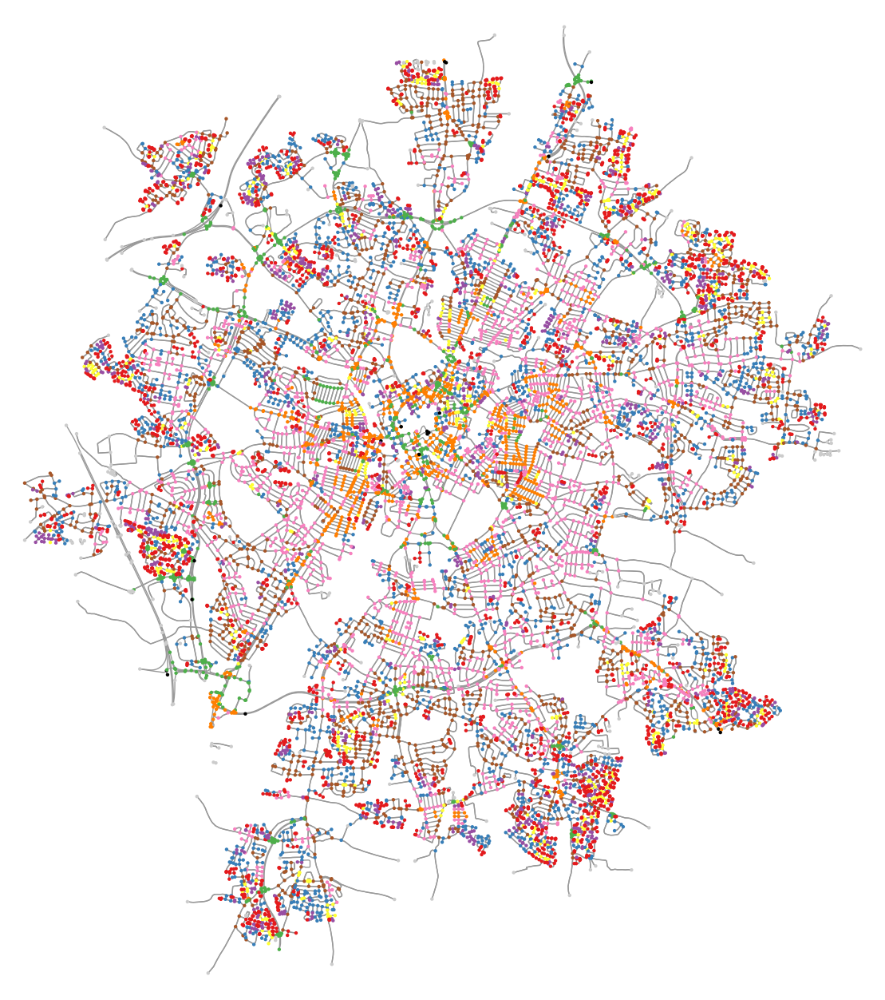

(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

In [24]:
ox.plot_graph(leicester_osmnx_graph_prj, node_color=[
    leicester_osmnx_graph_prj.nodes[node]["top_emb"] for node in leicester_osmnx_graph_prj.nodes],
    node_size=10, bgcolor="#ffffff",
    figsize=(16, 16))

## Correlations with node and ego-graph stats <a class="anchor" id="correlations"></a>

In this section, we examine the correlations between node and ego-graph pooled embeddings, and OSMnx statistics for the nodes within the city-wide network, the nodes within their ego-graph used to create the embeddings, and the basic stats for the ego-graph used to create the embeddings

We start by comining the embeddings dataframe with the pre-computed statisctics. See [`osmnx_stats_node_centrality_with_egograph_Leicester.py`](https://github.com/sdesabbata/gnn-urban-form/blob/main/code/osmnx_stats_node_centrality_with_egograph_Leicester.py) and [`osmnx_stats_egograph_basic_Leicester.py`](https://github.com/sdesabbata/gnn-urban-form/blob/main/code/osmnx_stats_egograph_basic_Leicester.py) for further details.

In [ ]:
leicester_emb_stats_for_corr = \
    leicester_emb_df[["osmnx_node_id", "EMB000", "EMB001"]].merge(
    # Ego-graph pooled embeddings
        pd.read_csv(this_repo_directory +
            "/data/leicester-1864_emb-pool_gnnuf_model_v0-5.csv"
            ).rename(columns={"EMB000":"EMB000pooled", "EMB001":"EMB001pooled"}),
        on="osmnx_node_id"
    ).merge(
    # Centrality including node-based and ego-graph-based
        pd.read_csv(this_repo_directory +
            "/data/leicester-1864_stats_node_centrality_with_egograph_dist500.csv"
            ).rename(columns={"node_id":"osmnx_node_id"}),
        on="osmnx_node_id"
    ).merge(
    # Ego-graph basic stats
        pd.read_csv(this_repo_directory +
            "/data/leicester-1864_stats_egograph_basic_dist500.csv"
            ).rename(columns={"node_id":"osmnx_node_id"}
            ).dropna(subset=["osmnx_node_id"])[
            ["osmnx_node_id","n", "m", "k_avg", "edge_length_total", "edge_length_avg",
            "streets_per_node_avg", "intersection_count", "street_length_total",
            "street_segment_count", "street_length_avg", "circuity_avg"]],
        on="osmnx_node_id"
    )

In [ ]:
leicester_emb_stats_for_corr.head()

We can start from plotting all variables using a pair-plot.

In [ ]:
sns.pairplot(leicester_emb_stats_for_corr.drop(columns=["osmnx_node_id"]), kind="hist")

As illustrated above, most variables are severely skewed. The embedding values are particularly skewed. Due to the nature of the values and their meaning -- encoding complex graph structures -- we assessed that attempting to un-skew those values would have not been a viable option. Moreover, we observe large number of ties in the values, especially for all *count* statistics such as the number of streets per node. As such, we decided to use the Kendall's tau rank correlation.

In [ ]:
print(leicester_emb_stats_for_corr.drop(columns=["osmnx_node_id"]).corr(method="kendall"))

We can also double-check our results using Spearman's rho rank correlation, obtaining similar although slightly higher values as expected -- although the analysis above is more robust.

In [ ]:
print(leicester_emb_stats_for_corr.drop(columns=["osmnx_node_id"]).corr(method="spearman"))

We export the full table including the embeddings and the statistics to create an additional visualisation as a pair plot in R -- see [this quarto document](https://sdesabbata.github.io/gnn-urban-form/gnnuf_exploratory_analysis_v0-5-emb_Leicester_correlations.html).

In [ ]:
leicester_emb_stats_for_corr.to_csv(this_repo_directory + "/data/leicester-1864_emb_gnnuf_model_v0-5_incl-pool-with-stats.csv", index=False)

## Node spot checks <a class="anchor" id="spot-checks"></a>

In this section we explore the ego-graphs of a few nodes selected based on their extreme embedding values.

### Low-low embeddings

In [ ]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 6782625866]

In [ ]:
ego_6782625866 = nx.generators.ego_graph(
    leicester_osmnx_graph, 6782625866,
    radius=max_distance, undirected=True, distance="length")
ego_6782625866_prj = ox.project_graph(ego_6782625866)
ox.plot_graph(
    ego_6782625866_prj,
    node_size=[20 if node == 6782625866 else 5 for node in ego_6782625866_prj.nodes],
    node_color=["#e41a1c" if node == 6782625866 else "#ffffff" for node in ego_6782625866_prj.nodes],
    figsize=(5, 5)
)

### Low-high embeddings

In [ ]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 354554417]

In [ ]:
ego_354554417 = nx.generators.ego_graph(
    leicester_osmnx_graph, 354554417,
    radius=max_distance, undirected=True, distance="length")
ego_354554417_prj = ox.project_graph(ego_354554417)
ox.plot_graph(
    ego_354554417_prj,
    node_size=[20 if node == 354554417 else 5 for node in ego_354554417_prj.nodes],
    node_color=["#e41a1c" if node == 354554417 else "#ffffff" for node in ego_354554417_prj.nodes],
    figsize=(5, 5)
)

### High-high embeddings

In [ ]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 1179199412]

In [ ]:
ego_1179199412 = nx.generators.ego_graph(
    leicester_osmnx_graph, 1179199412,
    radius=max_distance, undirected=True, distance="length")
ego_1179199412_prj = ox.project_graph(ego_1179199412)
ox.plot_graph(
    ego_1179199412_prj,
    node_size=[20 if node == 1179199412 else 5 for node in ego_1179199412_prj.nodes],
    node_color=["#e41a1c" if node == 1179199412 else "#ffffff" for node in ego_1179199412_prj.nodes],
    figsize=(5, 5)
)

### High-low embeddings

In [ ]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 296162322]

In [ ]:
ego_296162322 = nx.generators.ego_graph(
    leicester_osmnx_graph, 296162322,
    radius=max_distance, undirected=True, distance="length")
ego_296162322_prj = ox.project_graph(ego_296162322)
ox.plot_graph(
    ego_296162322_prj,
    node_size=[20 if node == 296162322 else 5 for node in ego_296162322_prj.nodes],
    node_color=["#e41a1c" if node == 296162322 else "#ffffff" for node in ego_296162322_prj.nodes],
    figsize=(5, 5)
)

### Central-middle embeddings

In [ ]:
leicester_emb_df[leicester_emb_df["osmnx_node_id"] == 2858142815]

In [ ]:
ego_2858142815 = nx.generators.ego_graph(
    leicester_osmnx_graph, 2858142815,
    radius=max_distance, undirected=True, distance="length")
ego_2858142815_prj = ox.project_graph(ego_2858142815)
ox.plot_graph(
    ego_2858142815_prj,
    node_size=[20 if node == 2858142815 else 5 for node in ego_2858142815_prj.nodes],
    node_color=["#e41a1c" if node == 2858142815 else "#ffffff" for node in ego_2858142815_prj.nodes],
    figsize=(5, 5)
)

## Exploring embedding patterns <a class="anchor" id="exploring-patters"></a>

In this section, we further explore the patterns in the embedding values and thier spatial distribution.

We start by exploring the three quantiles of each embedding dimension as a 3x3 bivariate colour scheme which is then replicated in the maps further below to illustrate how the bivariate quantiles are spatially distributed in Leicester.

In [ ]:
leicester_emb_patters_df = leicester_emb_df.copy()

leicester_emb_patters_df = leicester_emb_patters_df.merge(
    leicester_emb_stats_for_corr[["osmnx_node_id", "EMB000pooled", "EMB001pooled"]],
    on = "osmnx_node_id"
)

leicester_emb_patters_df.head()

In [ ]:
# This functions assigns a bivariate colour based on three quantiles
def bivariate_colour(x, limits):
    if x[0] is None or x[1] is None:
        return None
    else:
        if x[0] <= limits[0, 0]:
            if x[1] <= limits[1, 0]:
                # return "#e8e8e8"
                return "#e8e8e8"
            elif x[1] <= limits[1, 1]:
                # return "#cbb8d7"
                return "#e4acac"
            else:
                # return "#9972af"
                return "#c85a5a"
        if x[0] <= limits[0, 1]:
            if x[1] <= limits[1, 0]:
                # return "#e4d9ac"
                return "#b0d5df"
            elif x[1] <= limits[1, 1]:
                # return "#c8ada0"
                return "#ad9ea5"
            else:
                # return "#976b82"
                return "#985356"
        else:
            if x[1] <= limits[1, 0]:
                # return "#c8b35a"
                return "#64acbe"
            elif x[1] <= limits[1, 1]:
                # return "#af8e53"
                return "#627f8c"
            else:
                # return "#804d36"
                return "#574249"

Calculate the bivariate quantile colours for both the node enbeddings and the ego-graph pooled enbeddings.

In [ ]:
leicester_emb_quantiles = leicester_emb_patters_df[["EMB000", "EMB001"]].quantile([1/3, 2/3]).values.transpose()
leicester_emb_patters_df["bivariate_colour"] = leicester_emb_patters_df.apply(
    lambda x: bivariate_colour([x["EMB000"], x["EMB001"]], leicester_emb_quantiles), axis=1
)

leicester_emb_pooled_quantiles = leicester_emb_patters_df[["EMB000pooled", "EMB001pooled"]].quantile([1/3, 2/3]).values.transpose()
leicester_emb_patters_df["bivariate_colour_pooled"] = leicester_emb_patters_df.apply(
    lambda x: bivariate_colour([x["EMB000pooled"], x["EMB001pooled"]], leicester_emb_pooled_quantiles), axis=1
)

leicester_emb_patters_df.head()

Prepare geopandas dataframe for interactive maps.

In [ ]:
leicester_gdf = gpd.GeoDataFrame(
    leicester_osmnx_graph_prj_df,
    geometry=gpd.points_from_xy(
        leicester_osmnx_graph_prj_df.lon,
        leicester_osmnx_graph_prj_df.lat
    ),
    crs="EPSG:4326"
).merge(leicester_emb_patters_df, on='osmnx_node_id', how='left')
leicester_gdf.head()

### Bivariate quantiles <a class="anchor" id="bivariate"></a>

In [ ]:
plt.figure(figsize=(7,7))
ax = plt.axes()
ax.set_facecolor("white")
plt.scatter(
    x=leicester_emb_patters_df.EMB000,
    y=leicester_emb_patters_df.EMB001,
    c=leicester_emb_patters_df.bivariate_colour,
    s=10, edgecolors='black', linewidth=0.1)
plt.xlabel("Embeddings first dimension")
plt.ylabel("Embeddings second dimension")
plt.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=leicester_emb_patters_df.EMB000,
    y=leicester_emb_patters_df.EMB001,
    mode='markers',
    marker=dict(color=leicester_emb_patters_df.bivariate_colour)
))
fig.update_layout({"plot_bgcolor": "#ffffff"}, width=800, height=800)
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.show()

In [ ]:
leicester_osmnx_bivariate = leicester_osmnx_graph_prj.copy()

for node in leicester_osmnx_bivariate.nodes:
    node_bivariate_colour = leicester_emb_patters_df.loc[leicester_emb_patters_df["osmnx_node_id"] == node]
    if node_bivariate_colour.empty:
        leicester_osmnx_bivariate.nodes[node]["bivariate_colour"] = "#000000"
        leicester_osmnx_bivariate.nodes[node]["node_size"] = 1
    else:
        leicester_osmnx_bivariate.nodes[node]["bivariate_colour"] = node_bivariate_colour["bivariate_colour"].values[0]
        leicester_osmnx_bivariate.nodes[node]["node_size"] = 7

In [ ]:
ox.plot_graph(
    leicester_osmnx_bivariate,
    node_color=[leicester_osmnx_bivariate.nodes[node]["bivariate_colour"] for node in leicester_osmnx_bivariate.nodes],
    node_size=[leicester_osmnx_bivariate.nodes[node]["node_size"] for node in leicester_osmnx_bivariate.nodes],
    bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
    figsize=(12, 12))

#### Interactive bivariate map <a class="anchor" id="bivariate-map"></a>

In [ ]:
leicester_gdf[leicester_gdf["bivariate_colour"]!="#000000"].dropna(subset=["EMB000"]).explore(
    color="bivariate_colour",
    marker_kwds={"radius": 7}, style_kwds={"stroke": False},
    legend=True,
    tiles="Stamen Toner"
)

### Pooled embeddings bivariate quantiles <a class="anchor" id="bivariate-pooled"></a>

In [ ]:
plt.figure(figsize=(7,7))
ax = plt.axes()
ax.set_facecolor("white")
plt.scatter(
    x=leicester_emb_patters_df.EMB000pooled,
    y=leicester_emb_patters_df.EMB001pooled,
    c=leicester_emb_patters_df.bivariate_colour_pooled,
    s=10, edgecolors='black', linewidth=0.1)
plt.xlabel("Pooled embeddings first dimension")
plt.ylabel("Pooled embeddings second dimension")
plt.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=leicester_emb_patters_df.EMB000pooled,
    y=leicester_emb_patters_df.EMB001pooled,
    mode='markers',
    marker=dict(color=leicester_emb_patters_df.bivariate_colour_pooled)
))
fig.update_layout({"plot_bgcolor": "#ffffff"}, width=800, height=800)
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.show()

In [ ]:
for node in leicester_osmnx_bivariate.nodes:
    node_bivariate_colour = leicester_emb_patters_df.loc[leicester_emb_patters_df["osmnx_node_id"] == node]
    if node_bivariate_colour.empty:
        leicester_osmnx_bivariate.nodes[node]["bivariate_colour_pooled"] = "#000000"
    else:
        leicester_osmnx_bivariate.nodes[node]["bivariate_colour_pooled"] = node_bivariate_colour["bivariate_colour_pooled"].values[0]

In [ ]:
ox.plot_graph(
    leicester_osmnx_bivariate,
    node_color=[leicester_osmnx_bivariate.nodes[node]["bivariate_colour_pooled"] for node in leicester_osmnx_bivariate.nodes],
    node_size=[leicester_osmnx_bivariate.nodes[node]["node_size"] for node in leicester_osmnx_bivariate.nodes],
    bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
    figsize=(12, 12))

#### Interactive bivariate map <a class="anchor" id="bivariate-pooled-map"></a>

In [ ]:
leicester_gdf[leicester_gdf["bivariate_colour"]!="#000000"].dropna(subset=["EMB000"]).explore(
    color="bivariate_colour_pooled",
    marker_kwds={"radius": 7}, style_kwds={"stroke": False},
    legend=True,
    tiles="Stamen Toner"
)

### Clusters <a class="anchor" id="clusters"></a>

We then illustrate eight clusters of embeddings obtained using DBSCAN and how the related nodes are spatially distributed.

In [ ]:
from sklearn.cluster import DBSCAN
leicester_emb_df_clust = leicester_emb_df[["EMB000", "EMB001"]].dropna()
clust = DBSCAN(eps=0.11, min_samples=300)
leicester_emb_patters_df["clust"] = clust.fit_predict(leicester_emb_df_clust)
leicester_emb_patters_df["clust"].nunique()

In [ ]:
colorbrewer_set1 = ["#e41a1c", "#377eb8", "#4daf4a", "#984ea3", "#ff7f00", "#ffff33", "#a65628", "#f781bf", "#999999"]
leicester_emb_patters_df["clust_colour"] = leicester_emb_patters_df["clust"].apply(lambda x: colorbrewer_set1[x])
leicester_emb_patters_df.head()

In [ ]:
plt.figure(figsize=(7,7))
ax = plt.axes()
ax.set_facecolor("white")
plt.scatter(
    x=leicester_emb_patters_df.EMB000,
    y=leicester_emb_patters_df.EMB001,
    c=leicester_emb_patters_df.clust_colour,
    s=5, edgecolors='black', linewidth=0.1)
plt.xlabel("Embeddings first dimension")
plt.ylabel("Embeddings second dimension")
plt.show()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=leicester_emb_patters_df.EMB000,
    y=leicester_emb_patters_df.EMB001,
    mode='markers',
    marker=dict(color=leicester_emb_patters_df.clust_colour)
))
fig.update_layout({"plot_bgcolor": "#ffffff"}, width=800, height=800)
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='#cccccc', zeroline=True, zerolinewidth=1, zerolinecolor='#cccccc')
fig.show()

In [ ]:
for node in leicester_osmnx_bivariate.nodes:
    node_bivariate_colour = leicester_emb_patters_df.loc[leicester_emb_patters_df["osmnx_node_id"] == node]
    if node_bivariate_colour.empty:
        leicester_osmnx_bivariate.nodes[node]["clust_colour"] = "#000000"
    else:
        leicester_osmnx_bivariate.nodes[node]["clust_colour"] = node_bivariate_colour["clust_colour"].values[0]

In [ ]:
ox.plot_graph(
    leicester_osmnx_bivariate,
    node_color=[leicester_osmnx_bivariate.nodes[node]["clust_colour"] for node in leicester_osmnx_bivariate.nodes],
    node_size=[leicester_osmnx_bivariate.nodes[node]["node_size"]if leicester_osmnx_bivariate.nodes[node]["clust_colour"]!=colorbrewer_set1[-1] else 1 for node in leicester_osmnx_bivariate.nodes],
    bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
    figsize=(12, 12))

In [ ]:
# Delete leicester_gdf to re-create it including the clusters
del leicester_gdf
leicester_gdf = gpd.GeoDataFrame(
    leicester_osmnx_graph_prj_df,
    geometry=gpd.points_from_xy(
        leicester_osmnx_graph_prj_df.lon,
        leicester_osmnx_graph_prj_df.lat
    ),
    crs="EPSG:4326"
).merge(leicester_emb_patters_df, on='osmnx_node_id', how='left')
leicester_gdf.head()

#### Interactive clusters map <a class="anchor" id="clusters-map"></a>

In [ ]:
leicester_gdf[leicester_gdf["clust_colour"]!=colorbrewer_set1[-1]].dropna(subset=["EMB000"]).explore(
    color="clust_colour",
    marker_kwds={"radius": 7}, style_kwds={"stroke": False},
    tiles="Stamen Toner"
)

## Classic measures <a class="anchor" id="classic"></a>

In this section we illustrate how the city-wide and ego-graph-based measures of centrality are spatially distributed, as a point of comparison for the maps above. In particular, we illustrate closeness and betweenness centrality using a bivariate scheme, similarly to what done above for the two embeddings.

We also include in the comparison the As indicated the average number of streets per node and the average street lengths (taking the opposite value in order to better align the values and colours below to the embedding plots and maps) in the ego-graph, which are the values showing the highest correlation in the analysis above.


In [ ]:
leicester_osmnx_centrality = leicester_osmnx_graph_prj.copy()

In [ ]:
leicester_centralities_networkwide_quantiles = leicester_emb_stats_for_corr[["closeness_networkwide", "betweenness_networkwide"]].quantile([1/3, 2/3]).values.transpose()
leicester_emb_stats_for_corr["bivariate_centrality_networkwide"] = leicester_emb_stats_for_corr.apply(
    lambda x: bivariate_colour([x["closeness_networkwide"], x["betweenness_networkwide"]], leicester_centralities_networkwide_quantiles), axis=1
)

In [ ]:
leicester_centralities_egograph_quantiles = leicester_emb_stats_for_corr[["closeness_egograph", "betweenness_egograph"]].quantile([1/3, 2/3]).values.transpose()
leicester_emb_stats_for_corr["bivariate_centrality_egograph"] = leicester_emb_stats_for_corr.apply(
    lambda x: bivariate_colour([x["closeness_egograph"], x["betweenness_egograph"]], leicester_centralities_egograph_quantiles), axis=1
)

In [ ]:
leicester_emb_stats_for_corr["street_length_avg_opp"] = leicester_emb_stats_for_corr["street_length_avg"]*(-1)
leicester_streets_egograph_quantiles = leicester_emb_stats_for_corr[["streets_per_node_avg", "street_length_avg_opp"]].quantile([1/3, 2/3]).values.transpose()
leicester_emb_stats_for_corr["streets_landc_egograph"] = leicester_emb_stats_for_corr.apply(
    lambda x: bivariate_colour([x["streets_per_node_avg"], x["street_length_avg_opp"]], leicester_streets_egograph_quantiles), axis=1
)

In [ ]:
for node in leicester_osmnx_centrality.nodes:
    # networkwide
    leicester_osmnx_centrality.nodes[node]["closeness_networkwide"] = None
    leicester_osmnx_centrality.nodes[node]["betweenness_networkwide"] = None
    leicester_osmnx_centrality.nodes[node]["bivariate_centrality_networkwide"] = "#000000"
    # egograph
    leicester_osmnx_centrality.nodes[node]["closeness_egograph"] = None
    leicester_osmnx_centrality.nodes[node]["betweenness_egograph"] = None
    leicester_osmnx_centrality.nodes[node]["bivariate_centrality_egograph"] = "#000000"
    # streets length and count
    leicester_osmnx_centrality.nodes[node]["streets_per_node_avg"] = None
    leicester_osmnx_centrality.nodes[node]["street_length_avg_opp"] = None
    leicester_osmnx_centrality.nodes[node]["streets_landc_egograph"] = "#000000"
    if node in leicester_emb_stats_for_corr["osmnx_node_id"].values:
        # networkwide
        leicester_osmnx_centrality.nodes[node]["closeness_networkwide"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "closeness_networkwide"].values[0]
        leicester_osmnx_centrality.nodes[node]["betweenness_networkwide"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "betweenness_networkwide"].values[0]
        leicester_osmnx_centrality.nodes[node]["bivariate_centrality_networkwide"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "bivariate_centrality_networkwide"].values[0]
        # egograph
        leicester_osmnx_centrality.nodes[node]["closeness_egograph"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "closeness_egograph"].values[0]
        leicester_osmnx_centrality.nodes[node]["betweenness_egograph"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "betweenness_egograph"].values[0]
        leicester_osmnx_centrality.nodes[node]["bivariate_centrality_egograph"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "bivariate_centrality_egograph"].values[0]
        # streets length and count
        leicester_osmnx_centrality.nodes[node]["streets_per_node_avg"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "streets_per_node_avg"].values[0]
        leicester_osmnx_centrality.nodes[node]["street_length_avg_opp"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "street_length_avg_opp"].values[0]
        leicester_osmnx_centrality.nodes[node]["streets_landc_egograph"] = leicester_emb_stats_for_corr.loc[
            leicester_emb_stats_for_corr["osmnx_node_id"]==node, "streets_landc_egograph"].values[0]

### City-wide centrality <a class="anchor" id="classic-centrality-networkwide"></a>

In [ ]:
plt.figure(figsize=(7,7))
ax = plt.axes()
ax.set_facecolor("white")
ax.set_yscale('log')
plt.scatter(
    x=leicester_emb_stats_for_corr.closeness_networkwide,
    y=leicester_emb_stats_for_corr.betweenness_networkwide,
    c=leicester_emb_stats_for_corr.bivariate_centrality_networkwide,
    s=10, edgecolors='black', linewidth=0.1)
plt.xlabel("closeness_networkwide")
plt.ylabel("betweenness_networkwide")
plt.show()

In [ ]:
ox.plot_graph(
    leicester_osmnx_centrality,
    node_color=[leicester_osmnx_centrality.nodes[node]["bivariate_centrality_networkwide"] for node in leicester_osmnx_centrality.nodes],
    node_size=[1 if leicester_osmnx_centrality.nodes[node]["bivariate_centrality_networkwide"]=="#000000" else 7 for node in leicester_osmnx_centrality.nodes],
    bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
    figsize=(12, 12))

### Ego-graph centrality <a class="anchor" id="classic-centrality-egograph"></a>

In [ ]:
plt.figure(figsize=(7,7))
ax = plt.axes()
ax.set_facecolor("white")
ax.set_yscale('log')
plt.scatter(
    x=leicester_emb_stats_for_corr.closeness_egograph,
    y=leicester_emb_stats_for_corr.betweenness_egograph,
    c=leicester_emb_stats_for_corr.bivariate_centrality_egograph,
    s=10, edgecolors='black', linewidth=0.1)
plt.xlabel("closeness_egograph")
plt.ylabel("betweenness_egograph")
plt.show()

In [ ]:
ox.plot_graph(
    leicester_osmnx_centrality,
    node_color=[leicester_osmnx_centrality.nodes[node]["bivariate_centrality_egograph"] for node in leicester_osmnx_centrality.nodes],
    node_size=[1 if leicester_osmnx_centrality.nodes[node]["bivariate_centrality_egograph"]=="#000000" else 7 for node in leicester_osmnx_centrality.nodes],
    bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
    figsize=(12, 12))

### Street length and count <a class="anchor" id="classic-landc"></a>

In [ ]:
plt.figure(figsize=(7,7))
ax = plt.axes()
ax.set_facecolor("white")
plt.scatter(
    x=leicester_emb_stats_for_corr.streets_per_node_avg,
    y=leicester_emb_stats_for_corr.street_length_avg_opp,
    c=leicester_emb_stats_for_corr.streets_landc_egograph,
    s=10, edgecolors='black', linewidth=0.1)
plt.xlabel("streets_per_node_avg")
plt.ylabel("street_length_avg_opp")
plt.show()

In [ ]:
ox.plot_graph(
    leicester_osmnx_centrality,
    node_color=[leicester_osmnx_centrality.nodes[node]["streets_landc_egograph"] for node in leicester_osmnx_centrality.nodes],
    node_size=[1 if leicester_osmnx_centrality.nodes[node]["streets_landc_egograph"]=="#000000" else 7 for node in leicester_osmnx_centrality.nodes],
    bgcolor="#ffffff", edge_color="#000000", edge_linewidth=0.1,
    figsize=(12, 12))

As indicated by the correlation scores, the map above illustrating the number of streets per node and the average street lengths (taking the opposite value) shows the closest distribution to the pooled embeddings map, although with some differences, especially in the city centre. The difference with the node embedding map is more stark, as also illustrated by the correlation values.